<a href="https://colab.research.google.com/github/kleeresearch/happiness/blob/main/s2_korea_data_description.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Extension of Summer Institute in Computational Social Science (SICSS-Korea) 2024 Team Project

**Author:** Kyungmin Lee (kmlee@udel.edu)

**Team Members (ABC order):** Bryan Nathanael Wiljaya, Inkoo Kang, Ju Hee Jeung, Kyungmin Lee, Yumi Park

**Date:** July 13, 2024


**NOTE**

* I've got data loading issue. Since loading whole areas of South Korea has lack of RAM in colab, notebook will be collapsed and no londer plot figuers.

* Also, some "gu" or "gun" has no shapefiles or happiness data. Therefore, you might see some blank areas when seeing South Korea geospatial maps.

* Therefore, I concentrated on Seoul data. The governmental data about air quality is also available in Seoul.

* However, if anyone find any other data, please feel free to let me know. I can change the scope of research data analysis.




**Colab RAM Management for Large Dataset**

In [ ]:
import psutil

def get_memory_usage():
    memory_info = psutil.virtual_memory()
    return f"Total: {memory_info.total / (1024 ** 3):.2f} GB, Available: {memory_info.available / (1024 ** 3):.2f} GB, Used: {memory_info.used / (1024 ** 3):.2f} GB"

print(get_memory_usage())


Total: 12.67 GB, Available: 10.72 GB, Used: 1.67 GB


In [ ]:
import tensorflow as tf

# Clear the TensorFlow session
tf.keras.backend.clear_session()

# Stage 1. Data Loading

In [ ]:
!pip install pyreadstat

  Using cached pyreadstat-1.2.7-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (2.8 MB)


In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from tqdm import tqdm
import pyreadstat
import os
import geopandas as gp
from mpl_toolkits.axes_grid1 import make_axes_locatable

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# - Directory to Shared Drive
ROOT_DIR = '/content/drive/Shareddrives/SICSS_2024_groupproject/2_data'
DATA_DIR = 'data-korea/'
DATA_DIR = os.path.join(ROOT_DIR, DATA_DIR)

This research will use Preliminary Survey since Preliminary survey questions are similar with the 2021 and 2022 survey questions


In [ ]:
## HAPPINESS SURVEY DATA
df2020_ = pd.read_csv(os.path.join(DATA_DIR, "clean/korea-happiness-2020.csv"))
df2020 = pd.read_csv(os.path.join(DATA_DIR, "clean/korea-happiness-2020-pre.csv"))
df2021 = pd.read_csv(os.path.join(DATA_DIR, "clean/korea-happiness-2021.csv"))
df2022 = pd.read_csv(os.path.join(DATA_DIR, "clean/korea-happiness-2022.csv"))

In [ ]:
## KOREA GEOSHAPEFILE
koreamap = gp.read_file(os.path.join(DATA_DIR, "clean/korea-map-eng.shp"), encoding='utf-8')
koreamap

,ADM_SECT_C,SGG_NM,SGG_OID,COL_ADM_SE,SGG_NM_si,SGG_NM_gug,COL_ADM__1,COL_ADM__2,geometry
0,51110,강원특별자치도 춘천시,1.0,51110,Gangwon-do,Chuncheon,51,110,"POLYGON ((251303.119 609138.603, 251383.704 60..."
1,51130,강원특별자치도 원주시,1.0,51130,Gangwon-do,Wonju,51,130,"POLYGON ((282740.109 545196.602, 282777.514 54..."
2,51150,강원특별자치도 강릉시,674.0,51150,Gangwon-do,Gangneung,51,150,"MULTIPOLYGON (((382142.289 559458.922, 382140...."
3,51170,강원특별자치도 동해시,967.0,51170,Gangwon-do,Donghae,51,170,"MULTIPOLYGON (((391140.748 544267.306, 391139...."
4,51190,강원특별자치도 태백시,1.0,51190,Gangwon-do,Taebaek,51,190,"POLYGON ((378351.023 528235.314, 378349.186 52..."
...,...,...,...,...,...,...,...,...,...
247,43750,충청북도 진천군,690.0,43750,Chungcheongbuk-do,Jincheon-gun,43,750,"POLYGON ((239309.307 490416.822, 239333.563 49..."
248,43760,충청북도 괴산군,642.0,43760,Chungcheongbuk-do,Goesan-gun,43,760,"POLYGON ((271322.722 483491.397, 271337.379 48..."
249,43770,충청북도 음성군,1.0,43770,Chungcheongbuk-do,Eumseong-gun,43,770,"POLYGON ((255955.148 506302.521, 255972.493 50..."
250,43800,충청북도 단양군,1.0,43800,Chungcheongbuk-do,Danyang-gun,43,800,"POLYGON ((322949.129 507442.282, 322949.359 50..."


In [ ]:
koreamap_sub = koreamap[["ADM_SECT_C", "SGG_NM_si","SGG_NM_gug","geometry"]]
koreamap_sub.rename(columns={"ADM_SECT_C":"code","SGG_NM_si":"si","SGG_NM_gug":"gungu"}, inplace=True)

<ipython-input-52-7b2bb18198b6>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  koreamap_sub.rename(columns={"ADM_SECT_C":"code","SGG_NM_si":"si","SGG_NM_gug":"gungu"}, inplace=True)


In [ ]:
## SEOUL GEOSHAPEFILE

# - Load Seoul map merged with socioeconomic environmnetal data
ses_map2021 = gp.read_file(os.path.join(DATA_DIR, "clean/korea-map-2021.shp"), encoding='utf-8') #Only include Seoul

# Rename columns
ses_map2021.rename(columns={"happiness_":"happiness_score","happines_1":"happiness_ladder",
                          "avg_househ":"avg_households","TotalLivin":"TotalLivingPopulation",
                           "Employment":"Employment_Count",	"Education_":"Education_Level",
                          "Effective_":"Effective_Job_Openings","Effectiv_1":"Effective_Job_Seekers",
                          "Number_Of_":"Number_Of_Trainees"}, inplace=True)
ses_map2021

,ADM_SECT_C,gugun,happiness_score,happiness_ladder,GDP,housing,avg_households,TotalLivingPopulation,SO2,CO,Ozone,NO2,PM10,PM2.5,Employment_Count,Education_Level,Effective_Job_Openings,Effective_Job_Seekers,Number_Of_Trainees,geometry
0,11110,Jongno-gu,5.0,5.0,35719537.0,Free,5.833333,285239.204593,0.003430,0.506301,0.029258,0.023329,38.830137,20.416438,3399.0,4.038998,6790.0,43985.0,9439.0,"POLYGON ((197799.999 559069.695, 197785.848 55..."
1,11110,Jongno-gu,5.0,5.0,35719537.0,Lease,146.416667,285239.204593,0.003430,0.506301,0.029258,0.023329,38.830137,20.416438,3399.0,4.038998,6790.0,43985.0,9439.0,"POLYGON ((197799.999 559069.695, 197785.848 55..."
2,11110,Jongno-gu,5.0,5.0,35719537.0,Monthly lease,2.083333,285239.204593,0.003430,0.506301,0.029258,0.023329,38.830137,20.416438,3399.0,4.038998,6790.0,43985.0,9439.0,"POLYGON ((197799.999 559069.695, 197785.848 55..."
3,11110,Jongno-gu,5.0,5.0,35719537.0,Monthly rent with deposit,1137.750000,285239.204593,0.003430,0.506301,0.029258,0.023329,38.830137,20.416438,3399.0,4.038998,6790.0,43985.0,9439.0,"POLYGON ((197799.999 559069.695, 197785.848 55..."
4,11110,Jongno-gu,5.0,5.0,35719537.0,Monthly rent without deposit,1297.083333,285239.204593,0.003430,0.506301,0.029258,0.023329,38.830137,20.416438,3399.0,4.038998,6790.0,43985.0,9439.0,"POLYGON ((197799.999 559069.695, 197785.848 55..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19241,11740,Gangdong-gu,5.0,6.0,9364063.0,Lease,602.083333,513315.209157,0.002504,0.411507,0.024753,0.022441,39.189041,20.769231,10302.0,3.988529,9207.0,146346.0,4172.0,"POLYGON ((215841.933 552101.057, 215843.046 55..."
19242,11740,Gangdong-gu,5.0,6.0,9364063.0,Monthly lease,1.000000,513315.209157,0.002504,0.411507,0.024753,0.022441,39.189041,20.769231,10302.0,3.988529,9207.0,146346.0,4172.0,"POLYGON ((215841.933 552101.057, 215843.046 55..."
19243,11740,Gangdong-gu,5.0,6.0,9364063.0,Monthly rent with deposit,3189.250000,513315.209157,0.002504,0.411507,0.024753,0.022441,39.189041,20.769231,10302.0,3.988529,9207.0,146346.0,4172.0,"POLYGON ((215841.933 552101.057, 215843.046 55..."
19244,11740,Gangdong-gu,5.0,6.0,9364063.0,Monthly rent without deposit,1006.750000,513315.209157,0.002504,0.411507,0.024753,0.022441,39.189041,20.769231,10302.0,3.988529,9207.0,146346.0,4172.0,"POLYGON ((215841.933 552101.057, 215843.046 55..."


# Data Merge

## Merge Korea map (not Seoul) & Happiness 2021

In [ ]:
df2021["gugun_cd"] = df2021["gugun_cd"].astype(int).astype(str)

In [ ]:
# Merge Korea map and Happiness 2021 data
map2021 = koreamap_sub.merge(df2021, left_on='code', right_on='gugun_cd')

In [ ]:
print(map2021.columns.tolist())

['code', 'si', 'gungu', 'geometry', 'sido_cd', 'sido', 'gugun_cd', 'gugun', 'strata1', 'strata2', 'strata3', 'strata_cd', 'age', 'happiness_score', 'a2_1', 'a2_2', 'a2_3', 'a3_1', 'a3_2', 'a3_3', 'a3_4', 'a3_5', 'b1_1', 'b1_2', 'b1_3', 'b1_4', 'b1_5', 'b1_6', 'b1_7', 'b1_8', 'b1_9', 'b1_10', 'b2', 'b3', 'happiness_ladder', 'c2', 'c3', 'c4', 'c5', 'c6', 'c7_1', 'c7_2', 'c7_3', 'c7_4', 'c7_5', 'c7_6', 'c7_7', 'c7_8', 'c8', 'd1_1', 'd1_2', 'd1_3', 'd1_4', 'd1_5', 'd1_6', 'd1_7', 'd1_8', 'd1_9', 'd1_10', 'd1_11', 'd1_12', 'd1_13', 'd1_14', 'd1_15', 'd1_16', 'd1_17', 'd1_18', 'd1_19', 'd1_20', 'd2_1', 'd2_2', 'd2_3', 'd2_4', 'd2_5', 'd2_6', 'd3_1', 'd3_2', 'd3_3', 'd3_4', 'd3_5', 'd3_6', 'd3_7', 'd3_8', 'd3_9', 'd3_10', 'd3_11', 'd4_1', 'd4_2', 'd4_3', 'd5_1_1', 'd5_1_2', 'd5_1_3', 'd5_1_4', 'd5_1_5', 'd5_1_6', 'd5_1_7', 'd5_1_8', 'd5_1_9', 'd5_1_10', 'd5_1_11', 'd5_1_12', 'd5_1_13', 'd5_1_14', 'd5_1_15', 'd6', 'd7', 'd8_1', 'd8_2', 'd8_3', 'd8_4', 'd8_5', 'd8_6', 'd8_7', 'd8_8', 'd8_9', 'd

In [ ]:
# Replace one-hot encoded columns with categorical columns
map2021["sex"] = map2021.apply(lambda row: 1 if row["sex_1.0"] == 1 else 2, axis=1)
map2021["marriage"] = map2021.apply(lambda row: 1 if row["marriage_1.0"] == 1 else 2, axis=1)
map2021["housing"] = map2021.apply(lambda row: 1 if row["housing_1.0"] == 1 else 2, axis=1)

# Drop the original one-hot encoded columns
map2021.drop(columns=["sex_1.0", "sex_2.0", "marriage_1.0", "marriage_2.0", "housing_1.0", "housing_2.0"], inplace=True)

In [ ]:
# Subset columns
map2021_sub = map2021[["code","si","gungu","age",'sex','marriage','housing',"happiness_score","happiness_ladder","co1","geometry",]]

In [ ]:
# Define dictionaries
sex_dict = {1: "Male", 2: "Female"}

marriage_dict = {
    1: "Single",
    2: "Married",
    3: "Widowed",
    4: "Divorced",
    5: "Separated"
}

housing_dict = {
    1: "Own house",
    2: "Rent (full deposit)",
    3: "Rent (deposit)",
    4: "Rent (no deposit)",
    5: "Monthly rent",
    6: "Free accommodation"
}

# Replace numerical codes with descriptive strings using dictionaries
map2021_sub["sex"] = map2021_sub["sex"].map(sex_dict)
map2021_sub["marriage"] = map2021_sub["marriage"].map(marriage_dict)
map2021_sub["housing"] = map2021_sub["housing"].map(housing_dict)

# change types
map2021_sub["age"] = map2021_sub["age"].astype(int)

# rename column
map2021_sub.rename(columns={"co1":"covid"})

/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


,code,si,gungu,age,sex,marriage,housing,happiness_score,happiness_ladder,covid,geometry
0,11110,Seoul,Jongno-gu,76,Male,Married,Own house,3.0,3.0,5.0,"POLYGON ((197799.999 559069.695, 197785.848 55..."
1,11110,Seoul,Jongno-gu,54,Female,Married,Own house,8.0,7.0,5.0,"POLYGON ((197799.999 559069.695, 197785.848 55..."
2,11110,Seoul,Jongno-gu,59,Male,Married,Own house,7.0,7.0,5.0,"POLYGON ((197799.999 559069.695, 197785.848 55..."
3,11110,Seoul,Jongno-gu,30,Male,Single,Own house,7.0,5.0,5.0,"POLYGON ((197799.999 559069.695, 197785.848 55..."
4,11110,Seoul,Jongno-gu,39,Male,Single,Rent (full deposit),8.0,6.0,5.0,"POLYGON ((197799.999 559069.695, 197785.848 55..."
...,...,...,...,...,...,...,...,...,...,...,...
1065,31200,Ulsan,Buk-gu,55,Male,Single,Rent (full deposit),6.0,8.0,5.0,"MULTIPOLYGON (((422409.214 333501.000, 422408...."
1066,31200,Ulsan,Buk-gu,50,Male,Single,Rent (full deposit),8.0,8.0,5.0,"MULTIPOLYGON (((422409.214 333501.000, 422408...."
1067,31200,Ulsan,Buk-gu,48,Male,Married,Own house,7.0,8.0,5.0,"MULTIPOLYGON (((422409.214 333501.000, 422408...."
1068,31200,Ulsan,Buk-gu,47,Female,Married,Own house,7.0,8.0,5.0,"MULTIPOLYGON (((422409.214 333501.000, 422408...."


#Stage 2. Data Visualization

##Survey Demographic Data Analysis

In [ ]:
map2021 = map2021_sub.copy()

[]

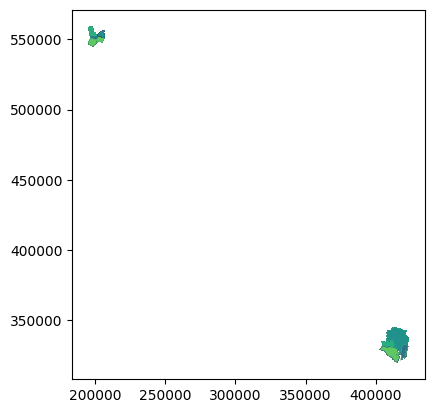

In [ ]:
map2021.plot("happiness_score")
plt.plot()

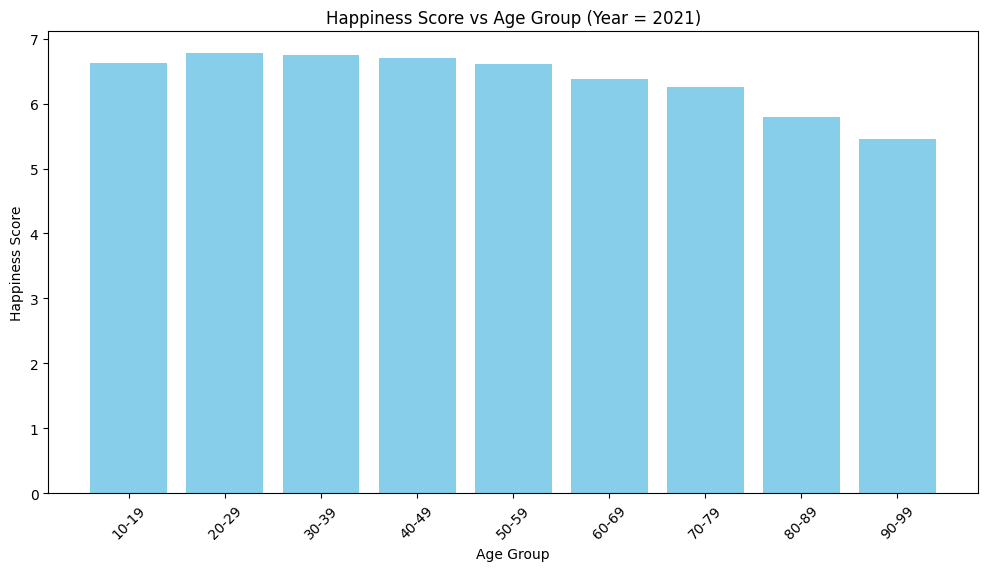

In [ ]:
# Create age bins
bins = list(range(10, 110, 10))
labels = [f'{i}-{i+9}' for i in range(10, 100, 10)]
map2021['age_group'] = pd.cut(map2021['age'], bins=bins, labels=labels, right=False)

# Group by age group and calculate the mean happiness score for each group
grouped = map2021.groupby('age_group')['happiness_score'].mean().reset_index()

# Plot the bar plot
plt.figure(figsize=(12, 6))
plt.bar(grouped['age_group'], grouped['happiness_score'], color='skyblue')
plt.ylabel('Happiness Score')
plt.xlabel('Age Group')
plt.title('Happiness Score vs Age Group (Year = 2021)')
plt.xticks(rotation=45)  # Rotate x-axis labels if needed
plt.show()

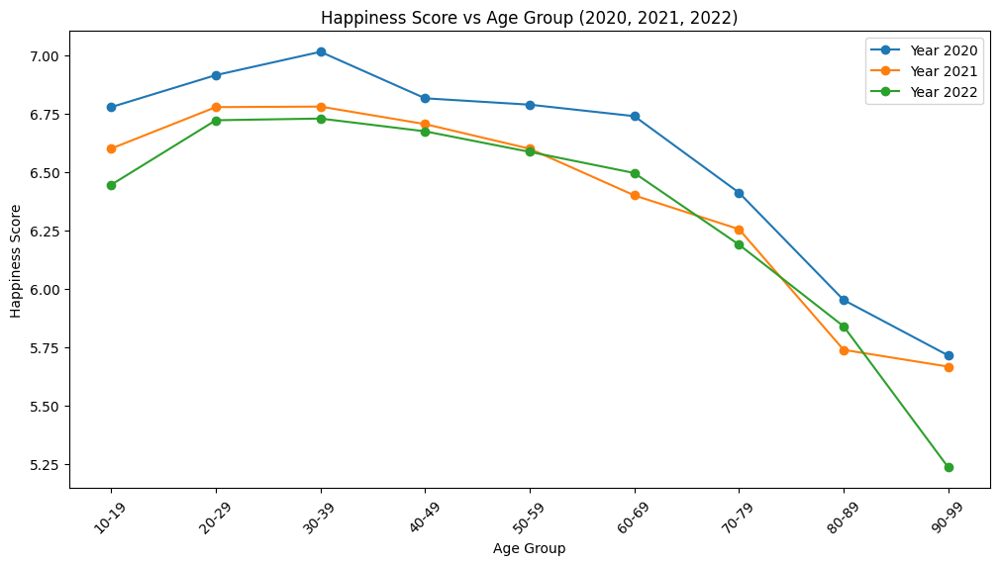

In [ ]:
# Create age bins and labels
bins = list(range(10, 110, 10))
labels = [f'{i}-{i+9}' for i in range(10, 100, 10)]

# Function to create age groups and calculate mean happiness score
def create_age_group_mean(df, year):
    df['age_group'] = pd.cut(df['age'], bins=bins, labels=labels, right=False)
    grouped = df.groupby('age_group')['happiness_score'].mean().reset_index()
    grouped['year'] = year
    return grouped

# Calculate age group mean happiness scores for each year
grouped_2020 = create_age_group_mean(df2020, 2020)
grouped_2021 = create_age_group_mean(df2021, 2021)
grouped_2022 = create_age_group_mean(df2022, 2022)

# Combine the dataframes
combined = pd.concat([grouped_2020, grouped_2021, grouped_2022])

# Plot the data
plt.figure(figsize=(12, 6))

for year in [2020, 2021, 2022]:
    subset = combined[combined['year'] == year]
    plt.plot(subset['age_group'], subset['happiness_score'], marker='o', label=f'Year {year}')

plt.ylabel('Happiness Score')
plt.xlabel('Age Group')
plt.title('Happiness Score vs Age Group (2020, 2021, 2022)')
plt.xticks(rotation=45)  # Rotate x-axis labels if needed
plt.legend()
plt.show()

<Figure size 1000x600 with 0 Axes>

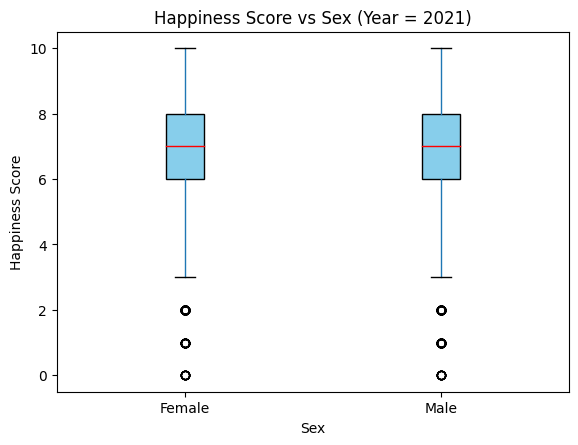

In [ ]:
# Convert one-hot encoding back to a single column
map2021['sex'] = map2021.apply(lambda row: 'Male' if row['sex_1.0'] == 1 else 'Female', axis=1)

# Plot the data using a box plot
plt.figure(figsize=(10, 6))
map2021.boxplot(column='happiness_score', by='sex', grid=False, patch_artist=True,
                boxprops=dict(facecolor='skyblue', color='black'),
                medianprops=dict(color='red'))
plt.ylabel('Happiness Score')
plt.xlabel('Sex')
plt.title('Happiness Score vs Sex (Year = 2021)')
plt.suptitle('')  # Remove the default subtitle
plt.show()

In [ ]:
df2020 = pd.get_dummies(df2020, columns=['sex'], dtype=float)
df2020

,gagu,sido,gugun,strataid,sido.1,sq5,age,happiness_score,a2_1,a2_2,...,co31_4,co31_5,co31_6,co31_7,co31_8,co31_9,co31_10,co31_11,sex_1.0,sex_2.0
0,1941.0,4.0,76.0,55.0,1.0,1.0,48.0,7.0,7.0,8.0,...,4.0,4.0,3.0,3.0,3.0,4.0,2.0,4.0,1.0,0.0
1,45.0,1.0,127.0,171.0,2.0,1.0,55.0,7.0,8.0,7.0,...,4.0,4.0,4.0,2.0,2.0,5.0,5.0,4.0,0.0,1.0
2,47.0,1.0,127.0,188.0,2.0,1.0,64.0,8.0,7.0,6.0,...,2.0,4.0,3.0,3.0,3.0,3.0,4.0,4.0,0.0,1.0
3,43.0,1.0,127.0,171.0,2.0,1.0,54.0,5.0,5.0,6.0,...,2.0,3.0,4.0,4.0,4.0,4.0,5.0,4.0,0.0,1.0
4,44.0,1.0,127.0,188.0,2.0,1.0,60.0,8.0,6.0,6.0,...,2.0,3.0,4.0,3.0,3.0,5.0,5.0,5.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13819,2604.0,7.0,52.0,41.0,1.0,5.0,35.0,6.0,3.0,4.0,...,4.0,4.0,4.0,3.0,4.0,4.0,4.0,4.0,1.0,0.0
13820,294.0,1.0,51.0,86.0,1.0,1.0,76.0,6.0,7.0,6.0,...,3.0,3.0,4.0,4.0,4.0,3.0,3.0,4.0,1.0,0.0
13821,294.0,1.0,51.0,188.0,2.0,1.0,79.0,7.0,7.0,6.0,...,4.0,4.0,3.0,3.0,3.0,4.0,4.0,4.0,0.0,1.0
13822,287.0,1.0,51.0,86.0,1.0,1.0,86.0,7.0,6.0,7.0,...,3.0,3.0,3.0,3.0,4.0,4.0,4.0,3.0,1.0,0.0


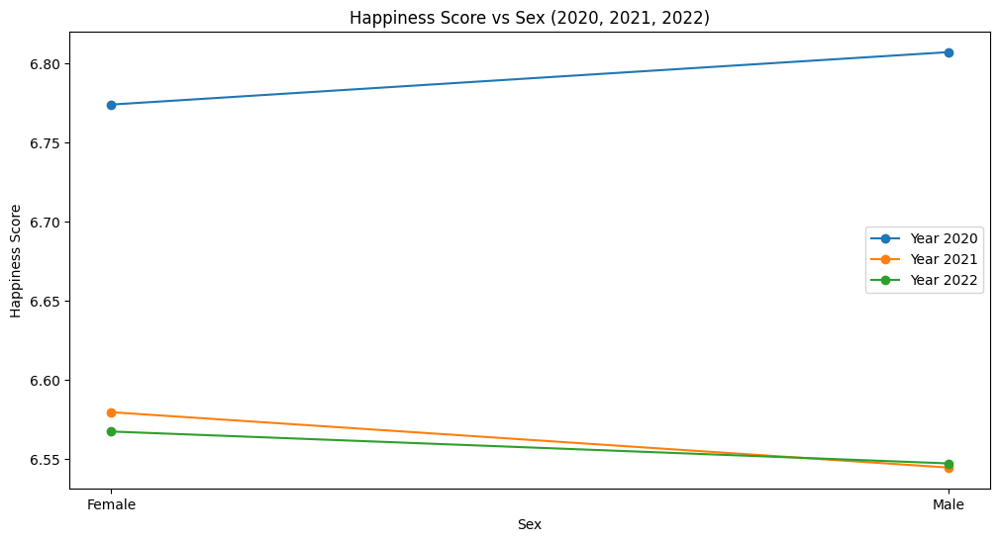

In [ ]:
# Convert one-hot encoding back to a single column for each year
def convert_sex_column(df):
    df['sex'] = df.apply(lambda row: 'Male' if row['sex_1.0'] == 1 else 'Female', axis=1)
    return df

df2020 = convert_sex_column(df2020)
df2021 = convert_sex_column(df2021)
df2022 = convert_sex_column(df2022)

# Function to group by 'sex' and calculate mean happiness score
def create_sex_group_mean(df, year):
    grouped = df.groupby('sex')['happiness_score'].mean().reset_index()
    grouped['year'] = year
    return grouped

# Calculate sex group mean happiness scores for each year
grouped_2020 = create_sex_group_mean(df2020, 2020)
grouped_2021 = create_sex_group_mean(df2021, 2021)
grouped_2022 = create_sex_group_mean(df2022, 2022)

# Combine the dataframes
combined = pd.concat([grouped_2020, grouped_2021, grouped_2022])

# Plot the data
plt.figure(figsize=(12, 6))

for year in [2020, 2021, 2022]:
    subset = combined[combined['year'] == year]
    plt.plot(subset['sex'], subset['happiness_score'], marker='o', label=f'Year {year}')

plt.ylabel('Happiness Score')
plt.xlabel('Sex')
plt.title('Happiness Score vs Sex (2020, 2021, 2022)')
plt.legend()
plt.show()


<Figure size 1500x600 with 0 Axes>

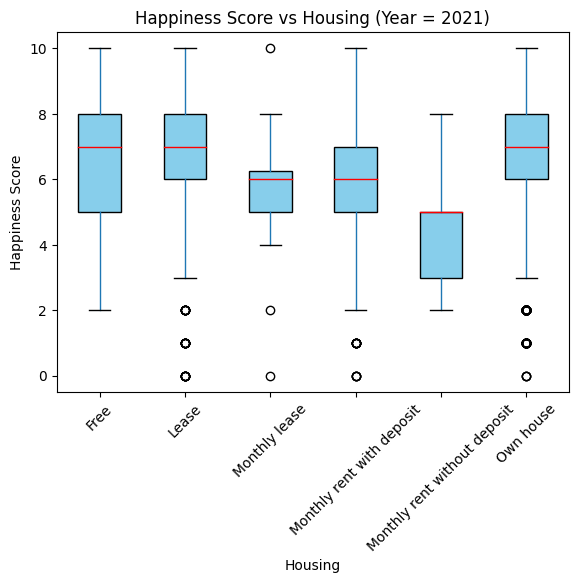

In [ ]:
# Assuming 'housing_1.0' to 'housing_6.0' represent different housing statuses
map2021['housing'] = map2021.apply(lambda row: 'Own house' if row['housing_1.0'] == 1 else
                                              'Lease' if row['housing_2.0'] == 1 else
                                              'Monthly rent with deposit' if row['housing_3.0'] == 1 else
                                              'Monthly rent without deposit' if row['housing_4.0'] == 1 else
                                              'Monthly lease' if row['housing_5.0'] == 1 else
                                              'Free' if row['housing_6.0'] == 1 else
                                              'Other', axis=1)

# Filter out the 'Other' category
map2021_filtered = map2021[map2021['housing'] != 'Other']

# Plot the data using a box plot
plt.figure(figsize=(15, 6))
map2021_filtered.boxplot(column='happiness_score', by='housing', grid=False, patch_artist=True,
                         boxprops=dict(facecolor='skyblue', color='black'),
                         medianprops=dict(color='red'))
plt.ylabel('Happiness Score')
plt.xlabel('Housing')
plt.title('Happiness Score vs Housing (Year = 2021)')
plt.suptitle('')  # Remove the default subtitle
plt.xticks(rotation=45)
plt.show()

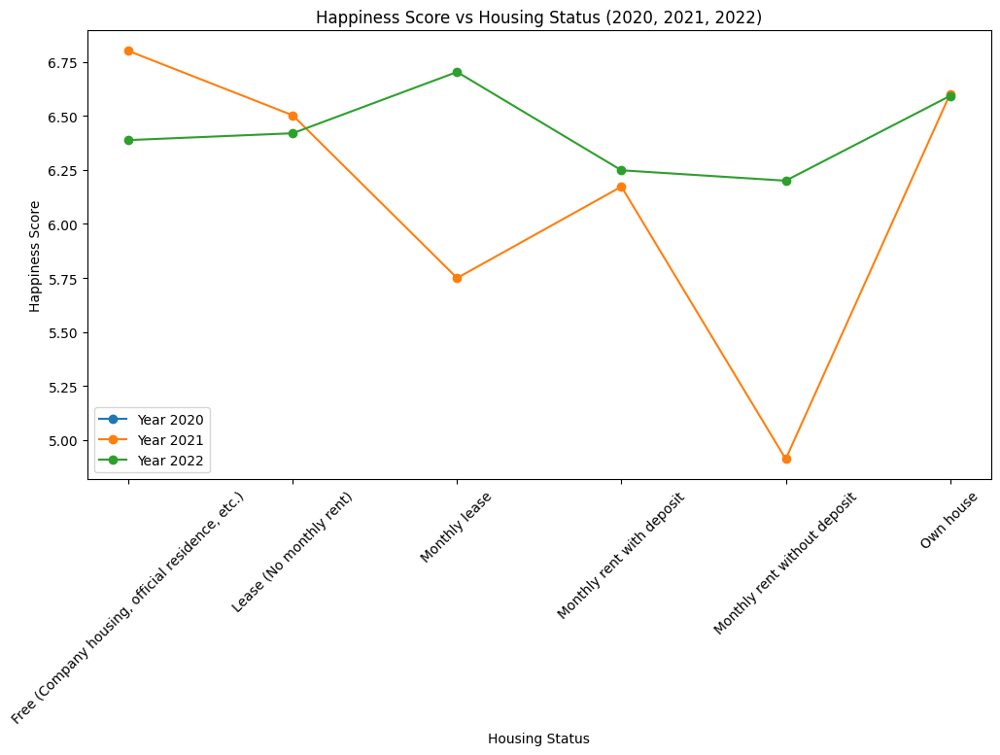

In [ ]:
# Convert one-hot encoding back to a single column for each year
def convert_housing_column(df):
    df['housing'] = df.apply(lambda row: 'Own house' if row['housing_1.0'] == 1 else
                                         'Lease (No monthly rent)' if row['housing_2.0'] == 1 else
                                         'Monthly rent with deposit' if row['housing_3.0'] == 1 else
                                         'Monthly rent without deposit' if row['housing_4.0'] == 1 else
                                         'Monthly lease' if row['housing_5.0'] == 1 else
                                         'Free (Company housing, official residence, etc.)' if row['housing_6.0'] == 1 else
                                         'Other', axis=1)
    return df

# Apply the conversion function to each year's DataFrame
#df2020 = convert_housing_column(df2020)
df2021 = convert_housing_column(df2021)
df2022 = convert_housing_column(df2022)

# Function to group by 'housing' and calculate mean happiness score
def create_housing_group_mean(df, year):
    grouped = df.groupby('housing')['happiness_score'].mean().reset_index()
    grouped['year'] = year
    return grouped

# Calculate housing group mean happiness scores for each year
#grouped_2020 = create_housing_group_mean(df2020, 2020)
grouped_2021 = create_housing_group_mean(df2021, 2021)
grouped_2022 = create_housing_group_mean(df2022, 2022)

# Combine the dataframes
combined = pd.concat([grouped_2020, grouped_2021, grouped_2022])

# Filter out the 'Other' category
combined = combined[combined['housing'] != 'Other']

# Plot the data
plt.figure(figsize=(12, 6))

for year in [2020, 2021, 2022]:
    subset = combined[combined['year'] == year]
    plt.plot(subset['housing'], subset['happiness_score'], marker='o', label=f'Year {year}')

plt.ylabel('Happiness Score')
plt.xlabel('Housing Status')
plt.title('Happiness Score vs Housing Status (2020, 2021, 2022)')
plt.legend()
plt.xticks(rotation=45)  # Rotate x-axis labels if needed
plt.show()


<Figure size 1500x600 with 0 Axes>

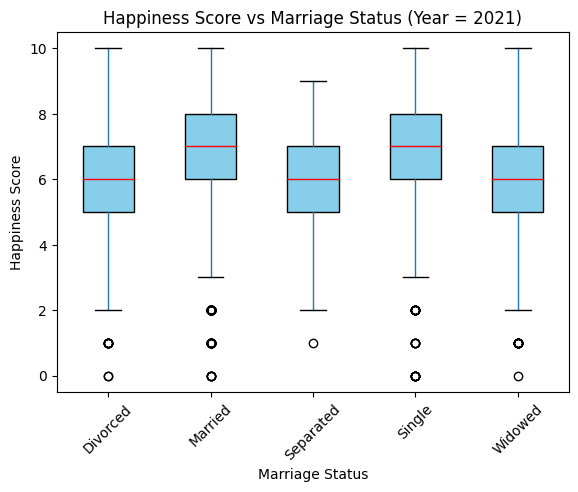

In [ ]:
# Assuming 'marriage_1.0' to 'marriage_5.0' represent different marriage statuses
map2021['marriage'] = map2021.apply(lambda row: 'Single' if row['marriage_1.0'] == 1 else
                                              'Married' if row['marriage_2.0'] == 1 else
                                              'Widowed' if row['marriage_3.0'] == 1 else
                                              'Divorced' if row['marriage_4.0'] == 1 else
                                              'Separated' if row['marriage_5.0'] == 1 else
                                              'Other', axis=1)

# Filter out the 'Other' category
map2021_filtered = map2021[map2021['marriage'] != 'Other']

# Plot the data using a box plot
plt.figure(figsize=(15, 6))
map2021_filtered.boxplot(column='happiness_score', by='marriage', grid=False, patch_artist=True,
                         boxprops=dict(facecolor='skyblue', color='black'),
                         medianprops=dict(color='red'))
plt.ylabel('Happiness Score')
plt.xlabel('Marriage Status')
plt.title('Happiness Score vs Marriage Status (Year = 2021)')
plt.suptitle('')  # Remove the default subtitle
plt.xticks(rotation=45)
plt.show()


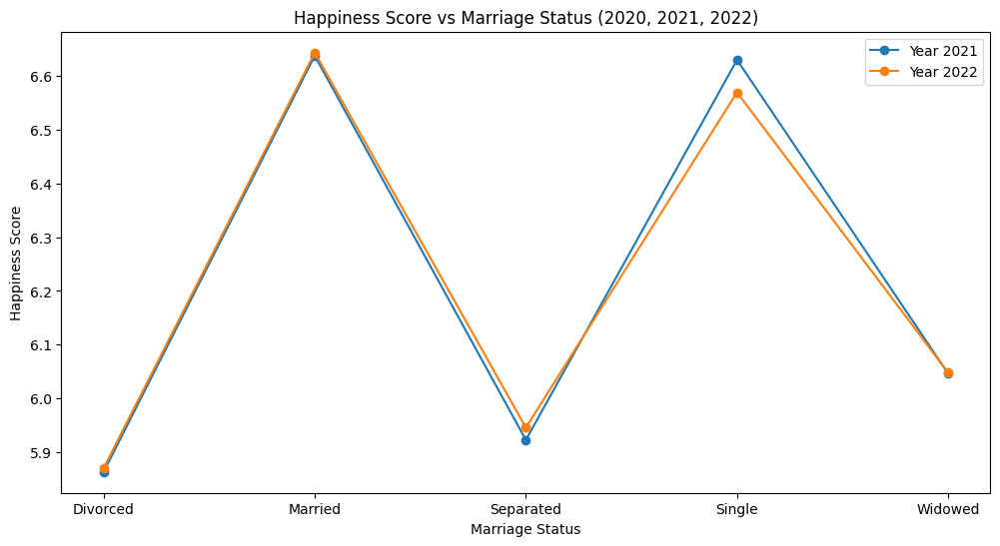

In [ ]:
# Convert one-hot encoding back to a single column for each year
def convert_marriage_column(df):
    df['marriage'] = df.apply(lambda row: 'Single' if row['marriage_1.0'] == 1 else
                                         'Married' if row['marriage_2.0'] == 1 else
                                         'Widowed' if row['marriage_3.0'] == 1 else
                                         'Divorced' if row['marriage_4.0'] == 1 else
                                         'Separated' if row['marriage_5.0'] == 1 else
                                         'Other', axis=1)
    return df

#df2020 = convert_marriage_column(df2020)
df2021 = convert_marriage_column(df2021)
df2022 = convert_marriage_column(df2022)

# Function to group by 'marriage' and calculate mean happiness score
def create_marriage_group_mean(df, year):
    grouped = df.groupby('marriage')['happiness_score'].mean().reset_index()
    grouped['year'] = year
    return grouped

# Calculate marriage group mean happiness scores for each year
#grouped_2020 = create_marriage_group_mean(df2020, 2020)
grouped_2021 = create_marriage_group_mean(df2021, 2021)
grouped_2022 = create_marriage_group_mean(df2022, 2022)

# Combine the dataframes
combined = pd.concat([grouped_2020, grouped_2021, grouped_2022])

# Plot the data
plt.figure(figsize=(12, 6))

for year in [2021, 2022]:
    subset = combined[combined['year'] == year]
    plt.plot(subset['marriage'], subset['happiness_score'], marker='o', label=f'Year {year}')

plt.ylabel('Happiness Score')
plt.xlabel('Marriage Status')
plt.title('Happiness Score vs Marriage Status (2020, 2021, 2022)')
plt.legend()
plt.show()


##Happiness Map of South Korea

In [ ]:
def map_gu(maplink):
  X = gp.read_file(maplink, encoding='euc-kr')
  X["SGG_NM_si"] = [X["SGG_NM"][i].split(" ")[0] for i in range(len(X))]
  X["SGG_NM_gugun"] = [X["SGG_NM"][i].split(" ")[1] for i in range(len(X))]
  X["COL_ADM_SE_si"] = [X["COL_ADM_SE"][i][:2] for i in range(len(X))]
  X["COL_ADM_SE_gugun"] = [X["COL_ADM_SE"][i][2:] for i in range(len(X))]
  return X

In [ ]:
def figure_making(DATA, NAME):
  # Create the plot
  fig, ax = plt.subplots(1, 2, figsize=(20, 10))  # Adjusted figsize for better aspect ratio

  # Plot the first map
  score = DATA.plot(
      column="happiness_score",
      cmap='viridis',
      linewidth=0.8,
      ax=ax[0],
      edgecolor='0.8'
  )

  # Set title for the first plot
  ax[0].set_title('Happiness Score in ' + NAME + ', South Korea (2021)')

  # Create colorbar for the first plot
  divider = make_axes_locatable(ax[0])
  cax = divider.append_axes("right", size="5%", pad=0.1)
  cbar = fig.colorbar(score.collections[0], cax=cax, orientation="vertical")
  cbar.set_label("Happiness Score")

  # Plot the second map
  ladder = DATA.plot(
      column="happiness_ladder",
      cmap='viridis',
      linewidth=0.8,
      ax=ax[1],
      edgecolor='0.8'
  )

  # Set title for the second plot
  ax[1].set_title('Happiness Ladder in ' + NAME + ', South Korea (2021)')

  # Create colorbar for the second plot
  divider = make_axes_locatable(ax[1])
  cax = divider.append_axes("right", size="5%", pad=0.1)
  cbar = fig.colorbar(ladder.collections[0], cax=cax, orientation="vertical")
  cbar.set_label("Happiness Ladder")

  # Adjust layout for better fit
  plt.tight_layout()

  # Show the plot
  plt.show()


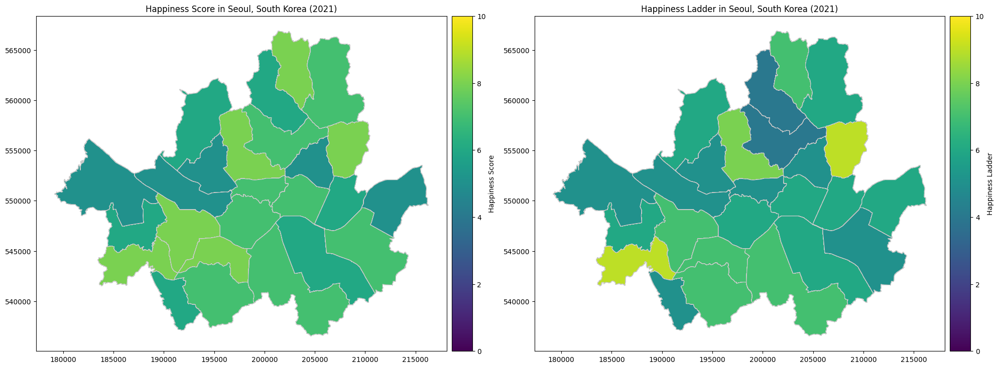

In [ ]:
figure_making(map_seoul, "Seoul")

**Note**: This part just shows geoshapefile. The code has been changed and it took so much time to load the data. No longer the data shows other areas than Seoul.

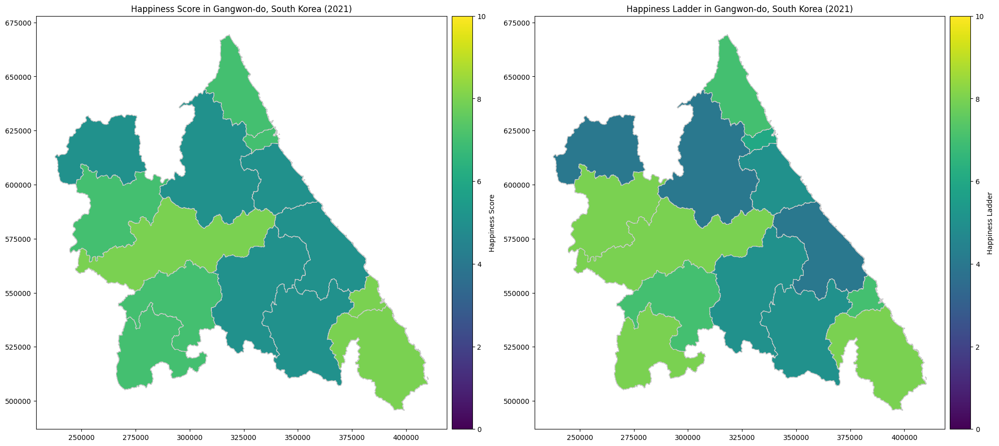

In [ ]:
figure_making(map_gangwon, "Gangwon-do")

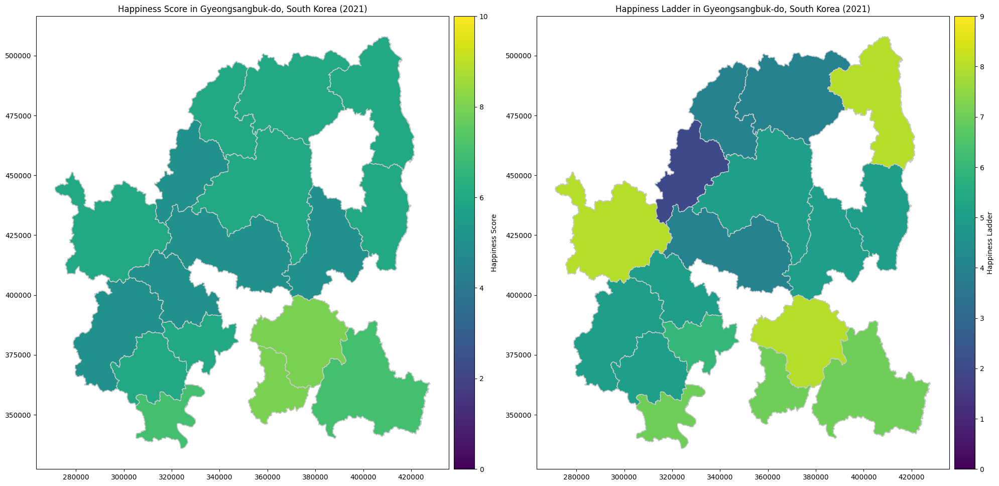

In [ ]:
figure_making(map_gyeongbuk, "Gyeongsangbuk-do")

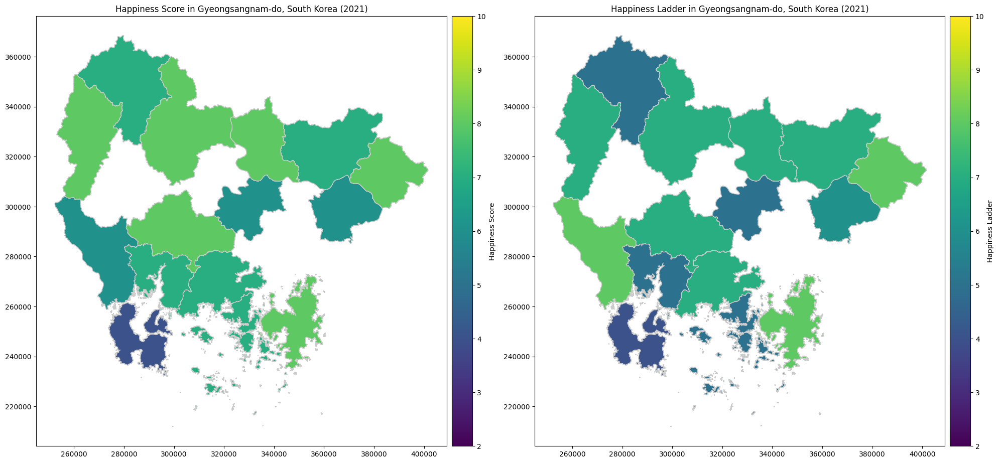

In [ ]:
figure_making(map_gyeongnam, "Gyeongsangnam-do")

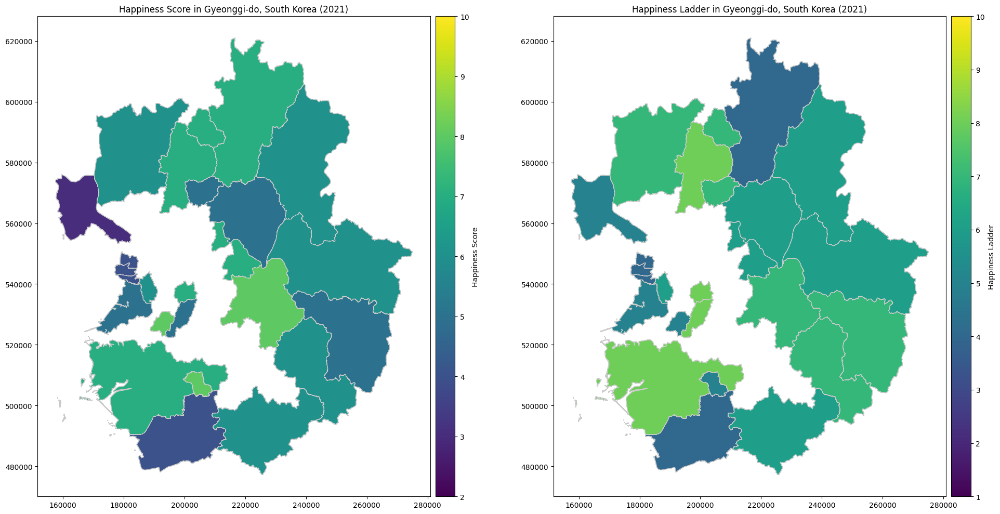

In [ ]:
figure_making(map_gyeonggi, "Gyeonggi-do")

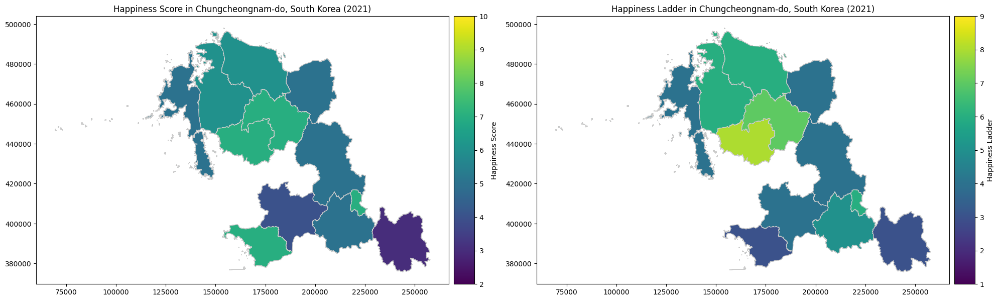

In [ ]:
figure_making(map_chungnam, "Chungcheongnam-do")

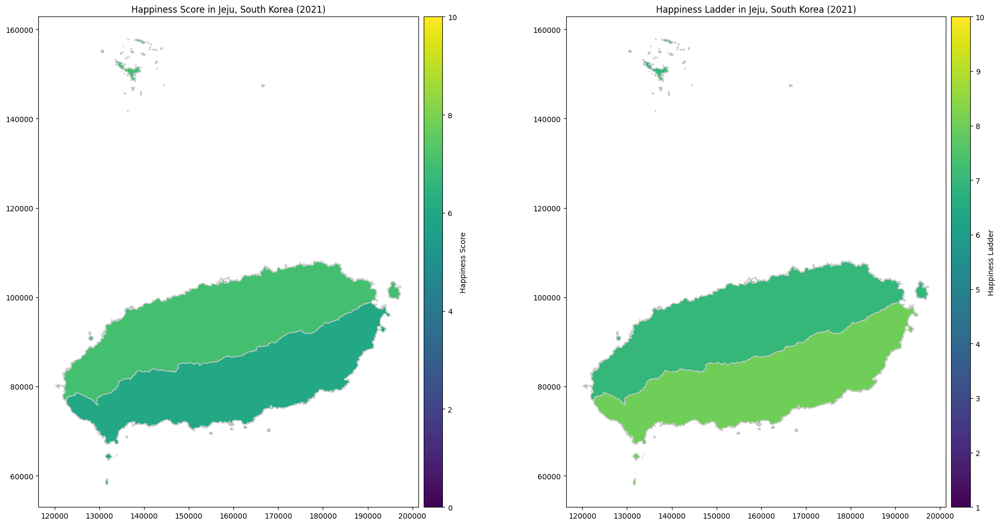

In [ ]:
figure_making(map_jeju, "Jeju")

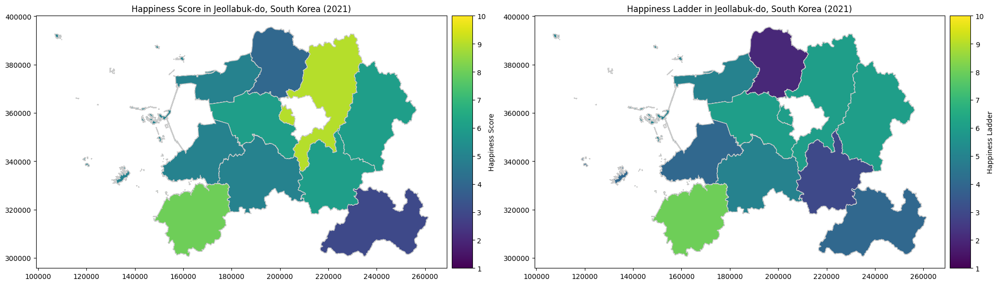

In [ ]:
figure_making(map_jeonbuk, "Jeollabuk-do")

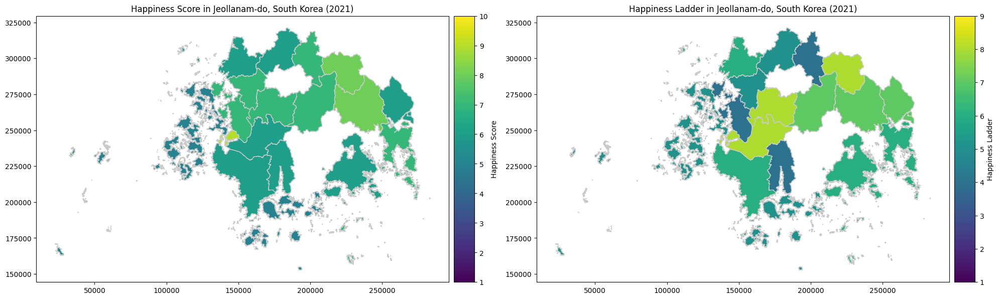

In [ ]:
figure_making(map_jeonnam, "Jeollanam-do")

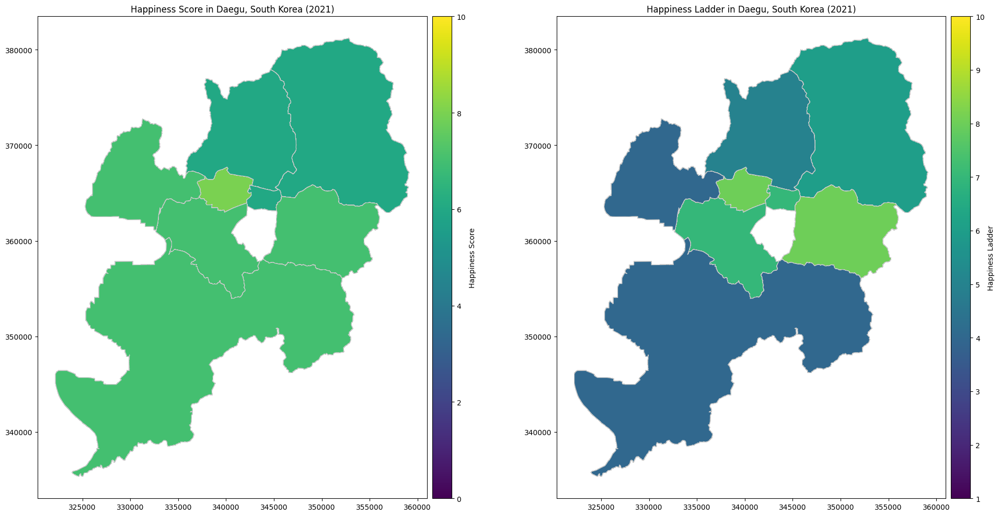

In [ ]:
figure_making(map_daegu, "Daegu")

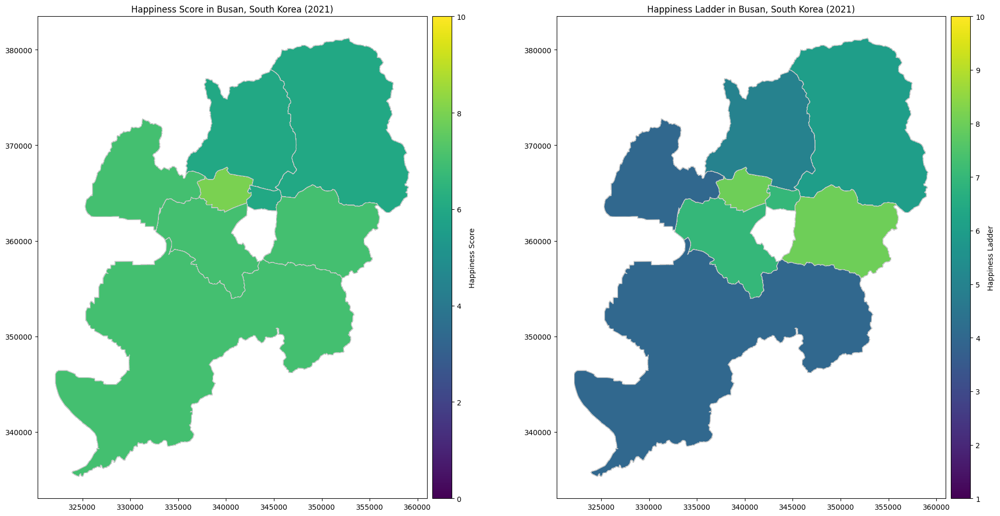

In [ ]:
figure_making(map_daegu, "Busan")

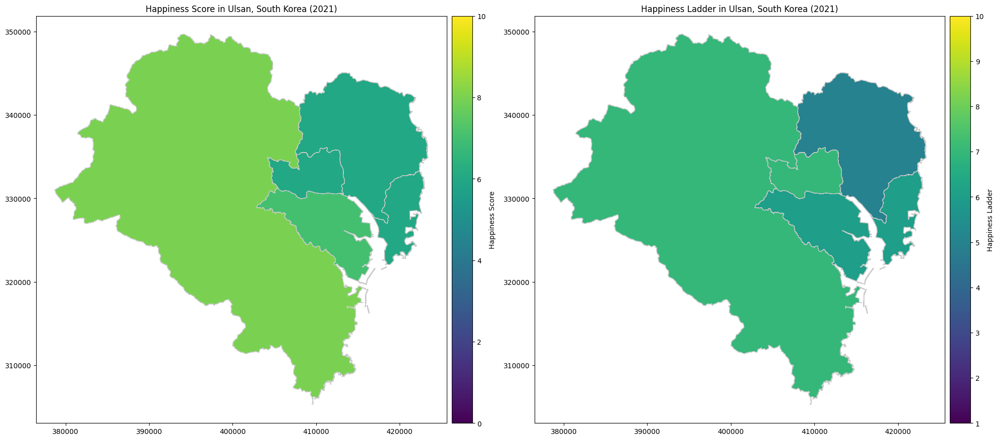

In [ ]:
figure_making(map_ulsan, "Ulsan")

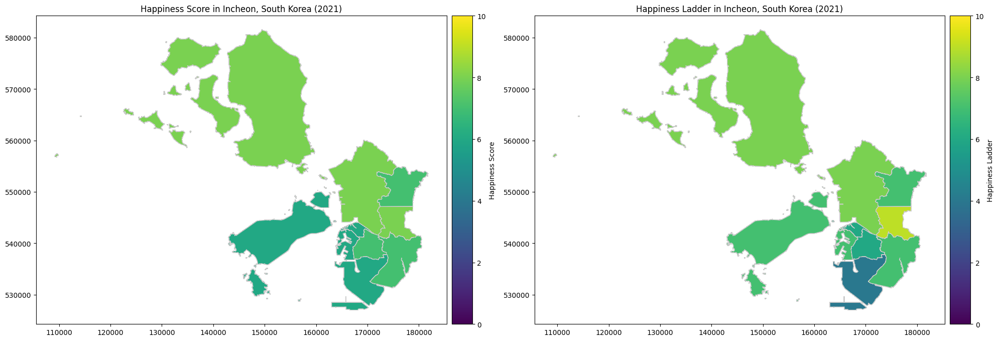

In [ ]:
figure_making(map_incheon, "Incheon")

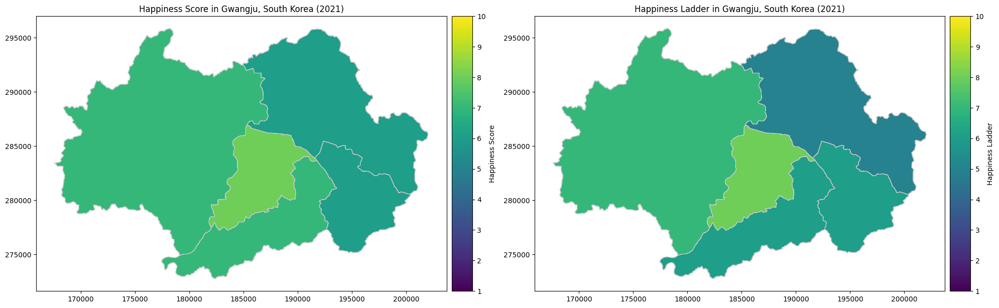

In [ ]:
figure_making(map_gwangju, "Gwangju")

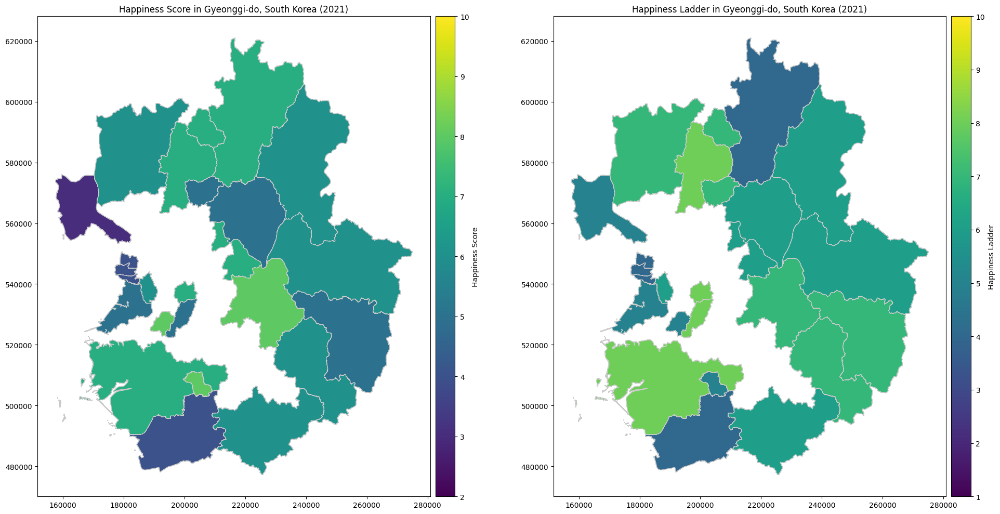

In [ ]:
figure_making(map_gyeonggi, "Gyeonggi-do")

##Environmental Quality

In [ ]:
# read data
df_air = pd.read_csv(os.path.join(DATA_DIR, "clean/seoul_airquality.csv"), encoding='euc-kr')

# Dictionary to map Korean column names to English
column_mapping = {
    '기준일': 'date',
    '시군구코드': 'sido',
    '시군구명': 'gungu',
    '총생활인구수': 'TotalLivingPopulation',
    '아황산가스': 'SO2',
    '일산화탄소': 'CO',
    '오존': 'Ozone',
    '이산화질소': 'NO2',
    'PM10': 'PM10',
    'PM2_5': 'PM2.5'
}

# Rename columns
df_air.rename(columns=column_mapping, inplace=True)
df_air

,date,sido,gungu,TotalLivingPopulation,SO2,CO,Ozone,NO2,PM10,PM2.5
0,2022-11-09,11000,서울시,1.097881e+07,0.003,0.7,0.019,0.038,71.0,49.0
1,2022-11-09,11110,종로구,3.355340e+05,0.003,0.8,0.019,0.040,72.0,52.0
2,2022-11-09,11140,중구,3.496408e+05,0.003,0.7,0.020,0.041,71.0,55.0
3,2022-11-09,11170,용산구,3.081681e+05,0.003,0.6,0.020,0.035,65.0,45.0
4,2022-11-09,11200,성동구,3.693757e+05,0.003,0.6,0.019,0.042,74.0,46.0
...,...,...,...,...,...,...,...,...,...,...
43337,2018-04-05,11620,관악구,5.272641e+05,0.003,0.4,0.021,0.028,11.0,8.0
43338,2018-04-05,11650,서초구,6.570409e+05,0.003,0.3,0.020,0.023,9.0,5.0
43339,2018-04-05,11680,강남구,9.128639e+05,0.005,0.4,0.012,0.034,3.0,3.0
43340,2018-04-05,11710,송파구,7.733757e+05,0.004,0.4,0.027,0.016,7.0,5.0


In [ ]:
import matplotlib.dates as mdates

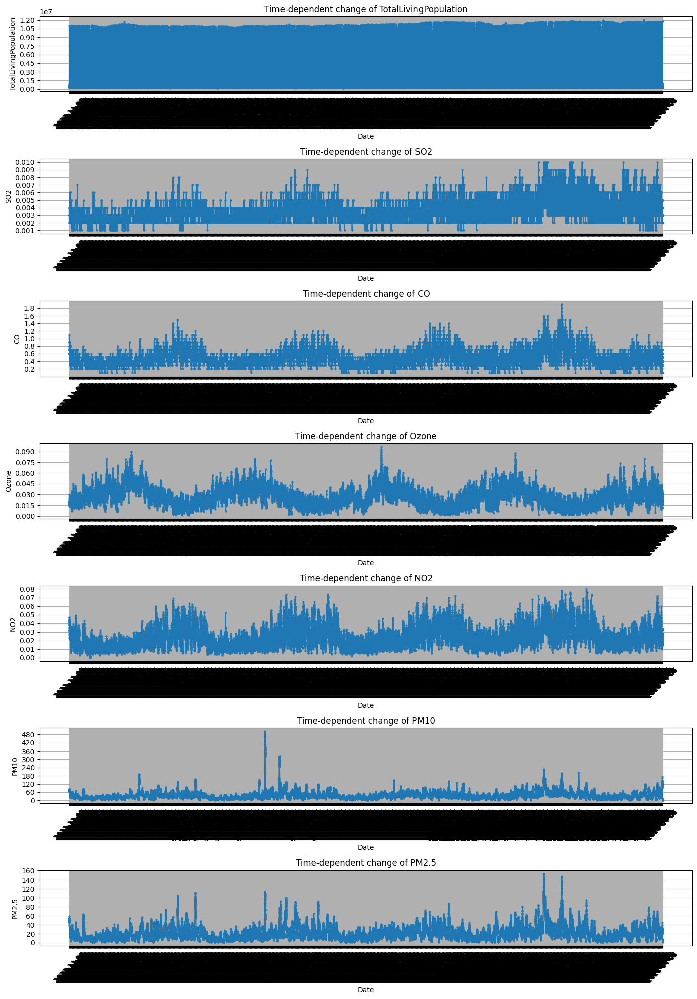

In [ ]:
# Plot time-dependent changes
columns_to_plot = ['TotalLivingPopulation', 'SO2', 'CO', 'Ozone', 'NO2', 'PM10', 'PM2.5']

plt.figure(figsize=(14, 20))

for i, column in enumerate(columns_to_plot, 1):
    plt.subplot(len(columns_to_plot), 1, i)
    plt.plot(df_air['date'], df_air[column], marker='o', markersize=2)
    plt.title(f'Time-dependent change of {column}')
    plt.xlabel('Date')
    plt.ylabel(column)
    plt.grid(True)

    # Set x-axis major ticks format
    #plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=10))
    #plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))

    # Optionally, set y-axis ticks if necessary
    plt.gca().yaxis.set_major_locator(plt.MaxNLocator(integer=True))

    # Rotate x-axis labels for better readability
    plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

<ipython-input-42-c1b72e335a14>:19: UserWarning: Glyph 44053 (\N{HANGUL SYLLABLE GANG}) missing from current font.
  plt.tight_layout()
<ipython-input-42-c1b72e335a14>:19: UserWarning: Glyph 45224 (\N{HANGUL SYLLABLE NAM}) missing from current font.
  plt.tight_layout()
<ipython-input-42-c1b72e335a14>:19: UserWarning: Glyph 44396 (\N{HANGUL SYLLABLE GU}) missing from current font.
  plt.tight_layout()
<ipython-input-42-c1b72e335a14>:19: UserWarning: Glyph 46041 (\N{HANGUL SYLLABLE DONG}) missing from current font.
  plt.tight_layout()
<ipython-input-42-c1b72e335a14>:19: UserWarning: Glyph 48513 (\N{HANGUL SYLLABLE BUG}) missing from current font.
  plt.tight_layout()
<ipython-input-42-c1b72e335a14>:19: UserWarning: Glyph 49436 (\N{HANGUL SYLLABLE SEO}) missing from current font.
  plt.tight_layout()
<ipython-input-42-c1b72e335a14>:19: UserWarning: Glyph 44288 (\N{HANGUL SYLLABLE GWAN}) missing from current font.
  plt.tight_layout()
<ipython-input-42-c1b72e335a14>:19: UserWarning: Glyp

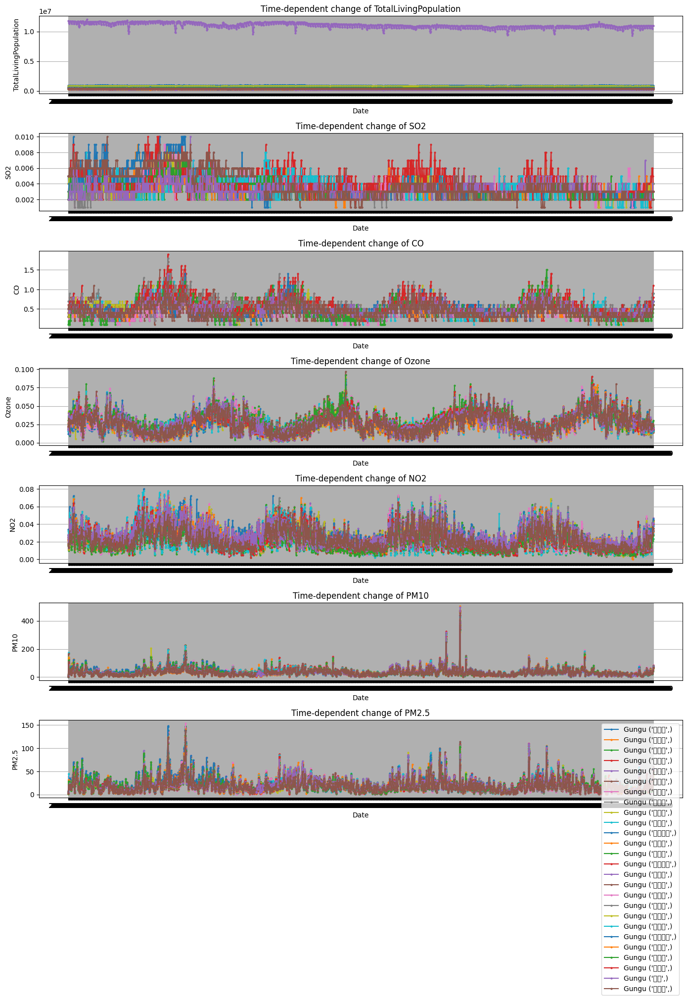

In [ ]:
# Group by 'gungu' and 'date'
grouped = df_air.groupby(['gungu', 'date']).mean().reset_index()

# Plot time-dependent changes for each 'gungu'
columns_to_plot = ['TotalLivingPopulation', 'SO2', 'CO', 'Ozone', 'NO2', 'PM10', 'PM2.5']

plt.figure(figsize=(14, 20))

for i, column in enumerate(columns_to_plot, 1):
    plt.subplot(len(columns_to_plot), 1, i)
    for key, grp in grouped.groupby(['gungu']):
        plt.plot(grp['date'], grp[column], marker='o', label=f'Gungu {key}', markersize=2)
    plt.title(f'Time-dependent change of {column}')
    plt.xlabel('Date')
    plt.ylabel(column)
    plt.grid(True)

plt.legend()
plt.tight_layout()
plt.show()


##Maps of Seoul

In [ ]:
ses_map2021.columns.tolist()

['ADM_SECT_C',
 'gugun',
 'happiness_score',
 'happiness_ladder',
 'GDP',
 'housing',
 'avg_households',
 'TotalLivingPopulation',
 'SO2',
 'CO',
 'Ozone',
 'NO2',
 'PM10',
 'PM2.5',
 'Employment_Count',
 'Education_Level',
 'Effective_Job_Openings',
 'Effective_Job_Seekers',
 'Number_Of_Trainees',
 'geometry']

In [ ]:
ses_map2021

,ADM_SECT_C,gugun,happiness_score,happiness_ladder,GDP,housing,avg_households,TotalLivingPopulation,SO2,CO,Ozone,NO2,PM10,PM2.5,Employment_Count,Education_Level,Effective_Job_Openings,Effective_Job_Seekers,Number_Of_Trainees,geometry
0,11110,Jongno-gu,5.0,5.0,35719537.0,Free,5.833333,285239.204593,0.003430,0.506301,0.029258,0.023329,38.830137,20.416438,3399.0,4.038998,6790.0,43985.0,9439.0,"POLYGON ((197799.999 559069.695, 197785.848 55..."
1,11110,Jongno-gu,5.0,5.0,35719537.0,Lease,146.416667,285239.204593,0.003430,0.506301,0.029258,0.023329,38.830137,20.416438,3399.0,4.038998,6790.0,43985.0,9439.0,"POLYGON ((197799.999 559069.695, 197785.848 55..."
2,11110,Jongno-gu,5.0,5.0,35719537.0,Monthly lease,2.083333,285239.204593,0.003430,0.506301,0.029258,0.023329,38.830137,20.416438,3399.0,4.038998,6790.0,43985.0,9439.0,"POLYGON ((197799.999 559069.695, 197785.848 55..."
3,11110,Jongno-gu,5.0,5.0,35719537.0,Monthly rent with deposit,1137.750000,285239.204593,0.003430,0.506301,0.029258,0.023329,38.830137,20.416438,3399.0,4.038998,6790.0,43985.0,9439.0,"POLYGON ((197799.999 559069.695, 197785.848 55..."
4,11110,Jongno-gu,5.0,5.0,35719537.0,Monthly rent without deposit,1297.083333,285239.204593,0.003430,0.506301,0.029258,0.023329,38.830137,20.416438,3399.0,4.038998,6790.0,43985.0,9439.0,"POLYGON ((197799.999 559069.695, 197785.848 55..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19241,11740,Gangdong-gu,5.0,6.0,9364063.0,Lease,602.083333,513315.209157,0.002504,0.411507,0.024753,0.022441,39.189041,20.769231,10302.0,3.988529,9207.0,146346.0,4172.0,"POLYGON ((215841.933 552101.057, 215843.046 55..."
19242,11740,Gangdong-gu,5.0,6.0,9364063.0,Monthly lease,1.000000,513315.209157,0.002504,0.411507,0.024753,0.022441,39.189041,20.769231,10302.0,3.988529,9207.0,146346.0,4172.0,"POLYGON ((215841.933 552101.057, 215843.046 55..."
19243,11740,Gangdong-gu,5.0,6.0,9364063.0,Monthly rent with deposit,3189.250000,513315.209157,0.002504,0.411507,0.024753,0.022441,39.189041,20.769231,10302.0,3.988529,9207.0,146346.0,4172.0,"POLYGON ((215841.933 552101.057, 215843.046 55..."
19244,11740,Gangdong-gu,5.0,6.0,9364063.0,Monthly rent without deposit,1006.750000,513315.209157,0.002504,0.411507,0.024753,0.022441,39.189041,20.769231,10302.0,3.988529,9207.0,146346.0,4172.0,"POLYGON ((215841.933 552101.057, 215843.046 55..."


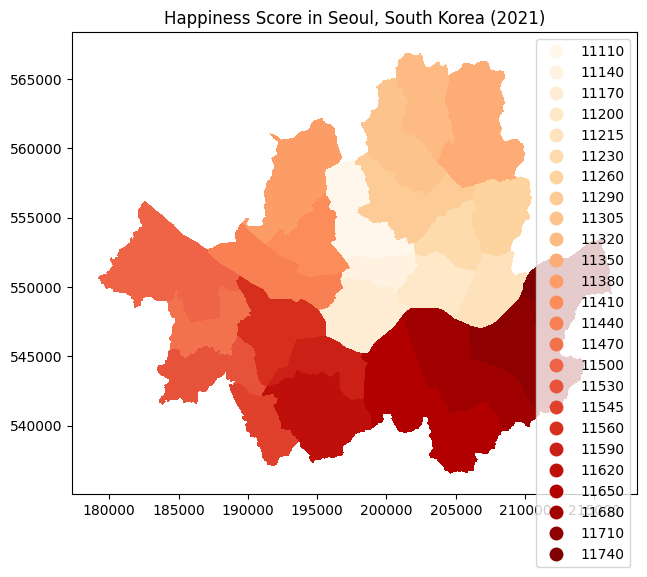

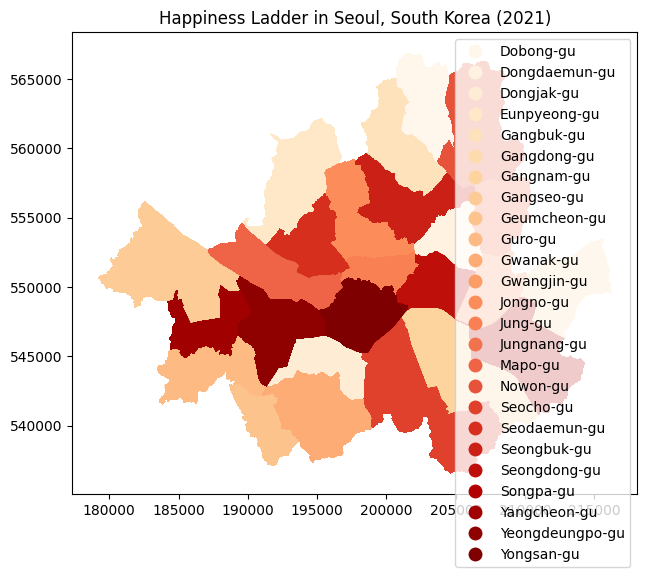

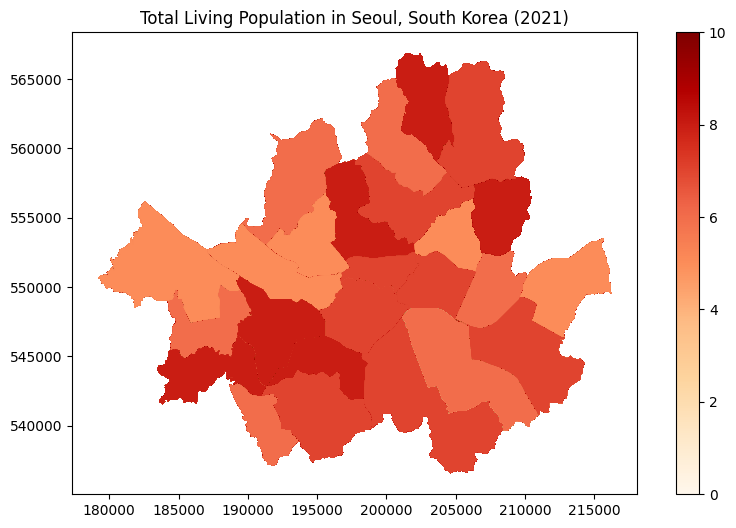

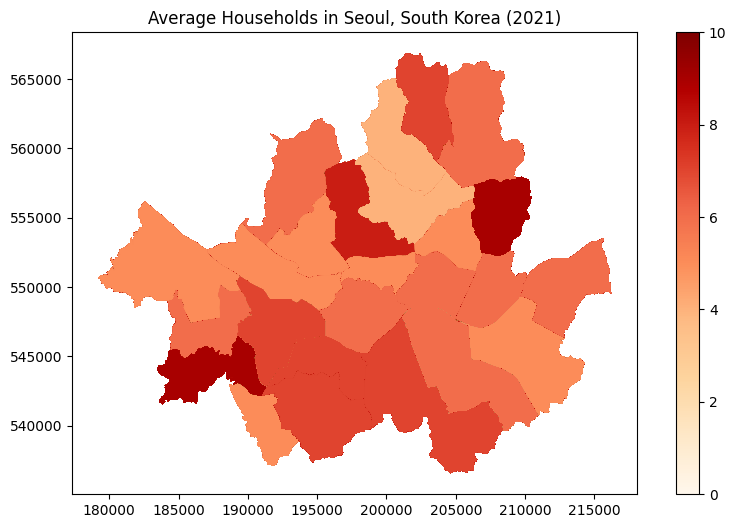

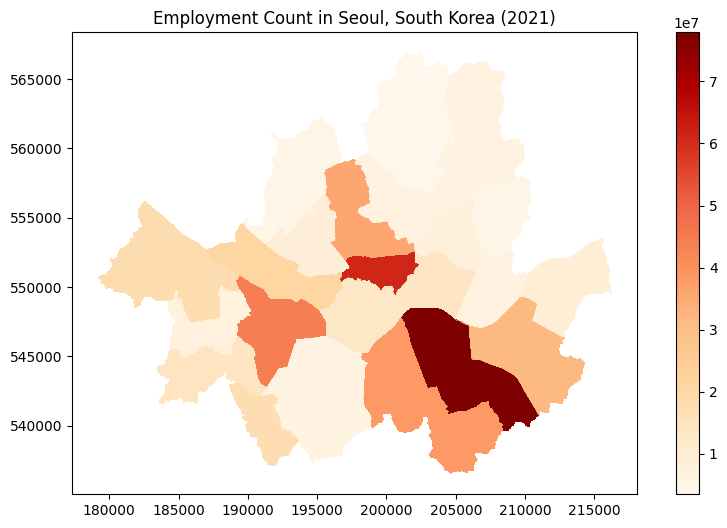

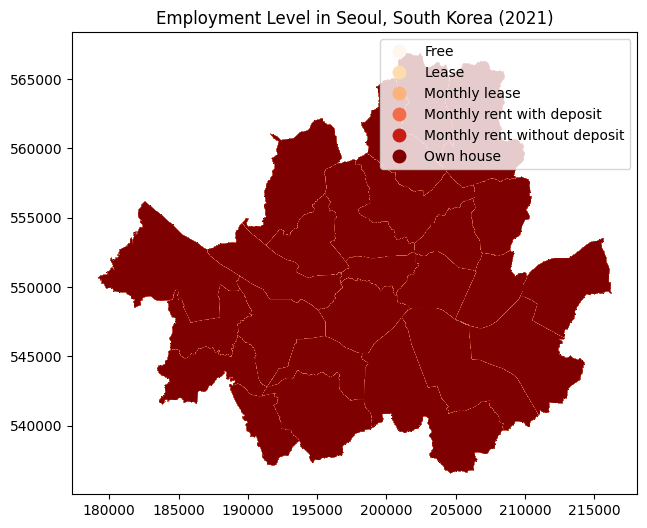

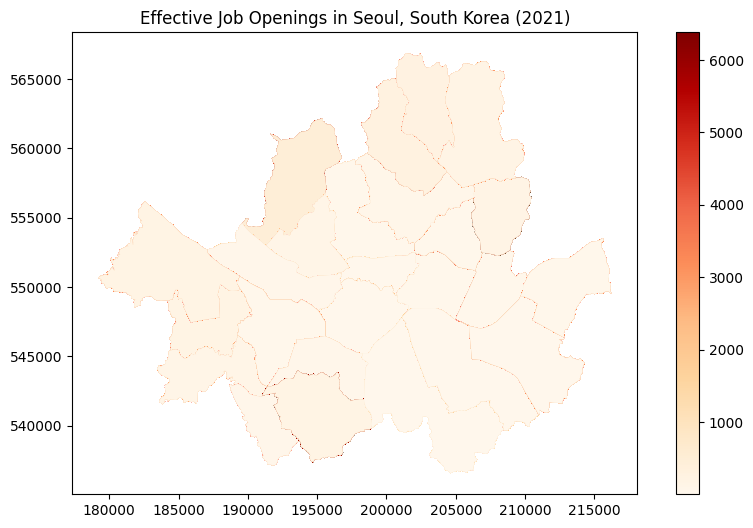

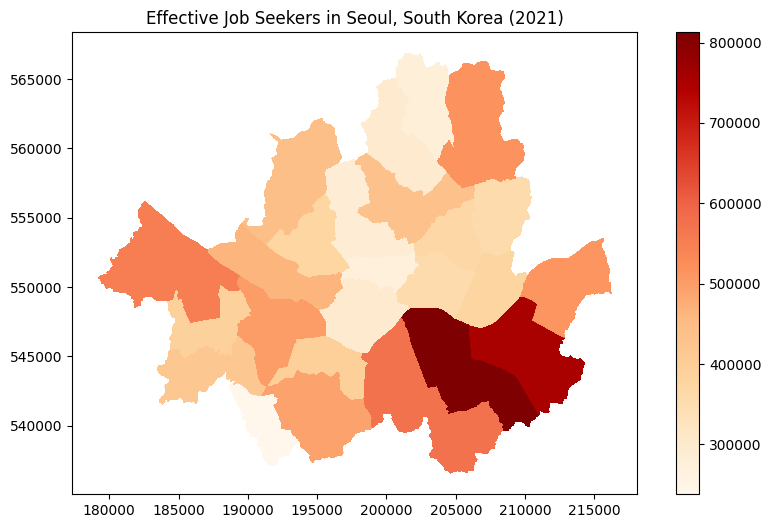

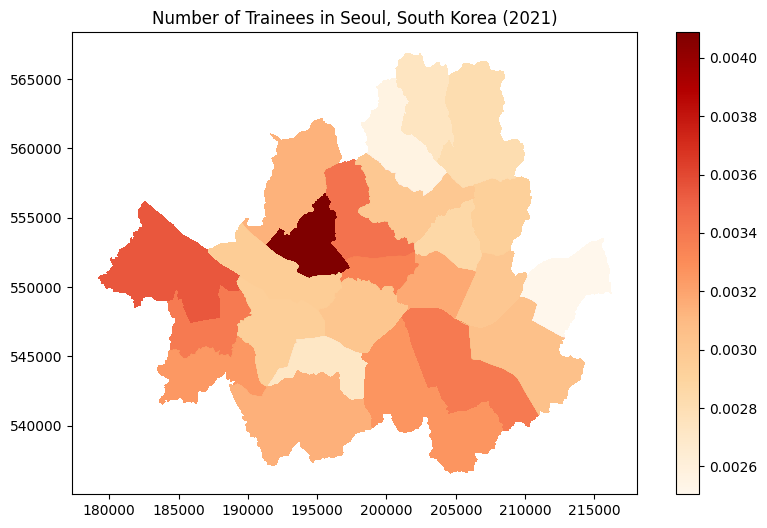

In [ ]:
# List of columns to plot
columns_to_plot = ses_map2021.columns.tolist()


# List of column titles
columns_list = ['Happiness Score', 'Happiness Ladder','Total Living Population',
                'Average Households', "Employment Count", "Employment Level",
                "Effective Job Openings", "Effective Job Seekers", "Number of Trainees"]

# Function to plot each column
def plot_geospatially(geodf, column, title):
    geodf.plot(column=column, legend=True, figsize=(10, 6), cmap='OrRd')
    plt.title(f'{title} in Seoul, South Korea (2021)')
    plt.show()

# Plot each column, use ses_map2021_sub instead of air_map2021_sub
for column, title in zip(columns_to_plot, columns_list):
    plot_geospatially(ses_map2021, column, title) # Changed to ses_map2021_sub

I subsetted ownhouse

In [ ]:
df = ses_map2021.copy()

In [ ]:
df

,ADM_SECT_C,gugun,happiness_score,happiness_ladder,GDP,housing,avg_households,TotalLivingPopulation,SO2,CO,Ozone,NO2,PM10,PM2.5,Employment_Count,Education_Level,Effective_Job_Openings,Effective_Job_Seekers,Number_Of_Trainees,geometry
0,11110,Jongno-gu,5.0,5.0,35719537.0,Free,5.833333,285239.204593,0.003430,0.506301,0.029258,0.023329,38.830137,20.416438,3399.0,4.038998,6790.0,43985.0,9439.0,"POLYGON ((197799.999 559069.695, 197785.848 55..."
1,11110,Jongno-gu,5.0,5.0,35719537.0,Lease,146.416667,285239.204593,0.003430,0.506301,0.029258,0.023329,38.830137,20.416438,3399.0,4.038998,6790.0,43985.0,9439.0,"POLYGON ((197799.999 559069.695, 197785.848 55..."
2,11110,Jongno-gu,5.0,5.0,35719537.0,Monthly lease,2.083333,285239.204593,0.003430,0.506301,0.029258,0.023329,38.830137,20.416438,3399.0,4.038998,6790.0,43985.0,9439.0,"POLYGON ((197799.999 559069.695, 197785.848 55..."
3,11110,Jongno-gu,5.0,5.0,35719537.0,Monthly rent with deposit,1137.750000,285239.204593,0.003430,0.506301,0.029258,0.023329,38.830137,20.416438,3399.0,4.038998,6790.0,43985.0,9439.0,"POLYGON ((197799.999 559069.695, 197785.848 55..."
4,11110,Jongno-gu,5.0,5.0,35719537.0,Monthly rent without deposit,1297.083333,285239.204593,0.003430,0.506301,0.029258,0.023329,38.830137,20.416438,3399.0,4.038998,6790.0,43985.0,9439.0,"POLYGON ((197799.999 559069.695, 197785.848 55..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19241,11740,Gangdong-gu,5.0,6.0,9364063.0,Lease,602.083333,513315.209157,0.002504,0.411507,0.024753,0.022441,39.189041,20.769231,10302.0,3.988529,9207.0,146346.0,4172.0,"POLYGON ((215841.933 552101.057, 215843.046 55..."
19242,11740,Gangdong-gu,5.0,6.0,9364063.0,Monthly lease,1.000000,513315.209157,0.002504,0.411507,0.024753,0.022441,39.189041,20.769231,10302.0,3.988529,9207.0,146346.0,4172.0,"POLYGON ((215841.933 552101.057, 215843.046 55..."
19243,11740,Gangdong-gu,5.0,6.0,9364063.0,Monthly rent with deposit,3189.250000,513315.209157,0.002504,0.411507,0.024753,0.022441,39.189041,20.769231,10302.0,3.988529,9207.0,146346.0,4172.0,"POLYGON ((215841.933 552101.057, 215843.046 55..."
19244,11740,Gangdong-gu,5.0,6.0,9364063.0,Monthly rent without deposit,1006.750000,513315.209157,0.002504,0.411507,0.024753,0.022441,39.189041,20.769231,10302.0,3.988529,9207.0,146346.0,4172.0,"POLYGON ((215841.933 552101.057, 215843.046 55..."


In [ ]:
df.columns.tolist()

['ADM_SECT_C',
 'gugun',
 'happiness_score',
 'happiness_ladder',
 'GDP',
 'housing',
 'avg_households',
 'TotalLivingPopulation',
 'SO2',
 'CO',
 'Ozone',
 'NO2',
 'PM10',
 'PM2.5',
 'Employment_Count',
 'Education_Level',
 'Effective_Job_Openings',
 'Effective_Job_Seekers',
 'Number_Of_Trainees',
 'geometry']

In [ ]:
df['Education_Level'] = pd.to_numeric(df['Education_Level'], errors='coerce')
df['Effective_Job_Openings'] = pd.to_numeric(df['Effective_Job_Openings'], errors='coerce')
df['Effective_Job_Seekers'] = pd.to_numeric(df['Effective_Job_Seekers'], errors='coerce')
df['Number_Of_Trainees'] = pd.to_numeric(df['Number_Of_Trainees'], errors='coerce')

In [ ]:
print(df[['Education_Level', 'Effective_Job_Openings', 'Effective_Job_Seekers', 'Number_Of_Trainees']].isnull().sum())


Education_Level           0
Effective_Job_Openings    0
Effective_Job_Seekers     0
Number_Of_Trainees        0
dtype: int64


In [ ]:
# Calculate the correlation matrix
corr_matrix = df[[ 'happiness_score',
 'happiness_ladder',
 'GDP',
 'housing',
 'avg_households',
 'TotalLivingPopulation',
 'SO2',
 'CO',
 'Ozone',
 'NO2',
 'PM10',
 'PM2.5']].corr()

# Plot the correlation matrix using a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Matrix of Air Quality and Happiness Data (2021)')
plt.show()

ValueError: could not convert string to float: 'Free'

In [ ]:
import seaborn as sns

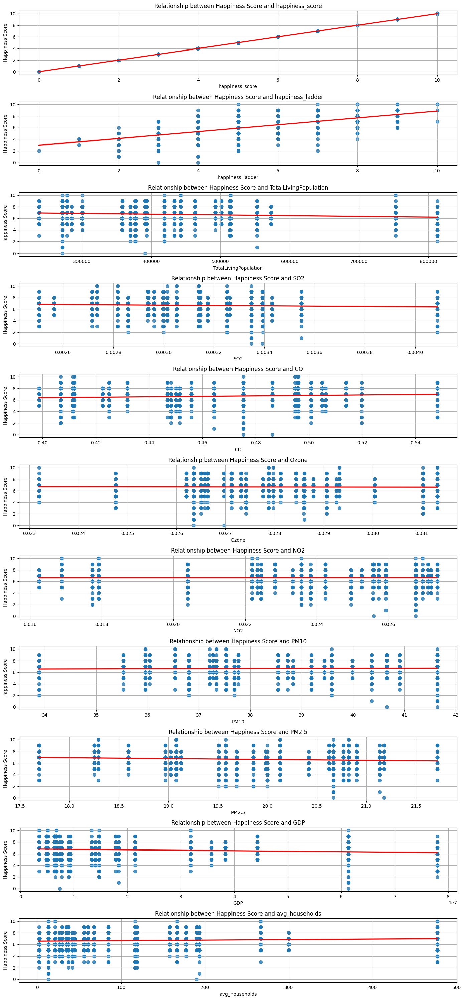

In [ ]:
# Columns to plot against happiness_score
columns_to_plot = ['happiness_score', 'happiness_ladder','TotalLivingPopulation',
        'SO2', 'CO', 'Ozone', 'NO2', 'PM10', 'PM2.5', 'GDP', 'avg_households']

# Create subplots
fig, axs = plt.subplots(len(columns_to_plot), 1, figsize=(14, 30))

for i, column in enumerate(columns_to_plot):
    # Plot happiness_score vs column
    sns.regplot(x=column, y='happiness_score', data = ses_map2021_ownh, scatter_kws={'s': 50}, line_kws={'color': 'red'}, ax=axs[i])
    axs[i].set_xlabel(column)
    axs[i].set_ylabel('Happiness Score')
    axs[i].set_title(f'Relationship between Happiness Score and {column}')
    axs[i].grid(True)

plt.tight_layout()
plt.show()